In [1]:
import geopandas as gpd

In [2]:
path_to_data = gpd.datasets.get_path("nybb")
gdf = gpd.read_file(path_to_data)

gdf

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."


In [3]:
gdf.to_file("my_file.geojson", driver="GeoJSON")

In [4]:
gdf = gdf.set_index("BoroName")

In [5]:
gdf["area"] = gdf.area
gdf["area"]

BoroName
Staten Island    1.623822e+09
Queens           3.045214e+09
Brooklyn         1.937478e+09
Manhattan        6.364712e+08
Bronx            1.186926e+09
Name: area, dtype: float64

In [6]:
gdf["boundary"] = gdf.boundary
gdf["boundary"]

BoroName
Staten Island    MULTILINESTRING ((970217.022 145643.332, 97022...
Queens           MULTILINESTRING ((1029606.077 156073.814, 1029...
Brooklyn         MULTILINESTRING ((1021176.479 151374.797, 1021...
Manhattan        MULTILINESTRING ((981219.056 188655.316, 98094...
Bronx            MULTILINESTRING ((1012821.806 229228.265, 1012...
Name: boundary, dtype: geometry

In [7]:
gdf["centroid"] = gdf.centroid
gdf["centroid"]

BoroName
Staten Island     POINT (941639.450 150931.991)
Queens           POINT (1034578.078 197116.604)
Brooklyn          POINT (998769.115 174169.761)
Manhattan         POINT (993336.965 222451.437)
Bronx            POINT (1021174.790 249937.980)
Name: centroid, dtype: geometry

In [8]:
first_point = gdf["centroid"].iloc[0]
gdf["distance"] = gdf["centroid"].distance(first_point)
gdf["distance"]

BoroName
Staten Island         0.000000
Queens           103781.535276
Brooklyn          61674.893421
Manhattan         88247.742789
Bronx            126996.283623
Name: distance, dtype: float64

In [9]:
gdf["distance"].mean()

76140.09102166798

<AxesSubplot:>

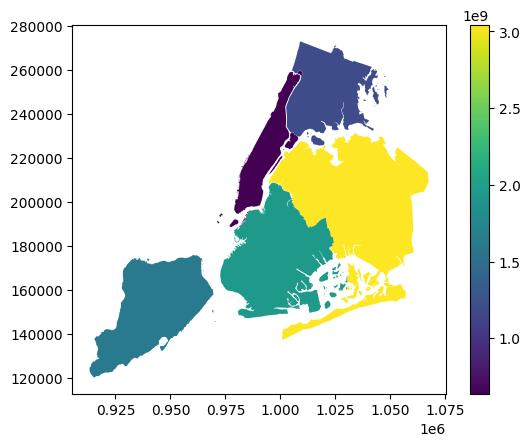

In [10]:
gdf.plot("area", legend=True)

<AxesSubplot:>

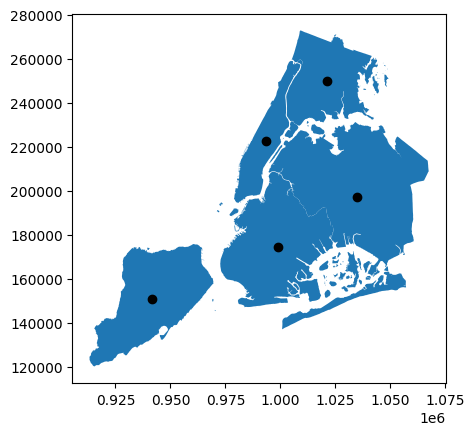

In [11]:
ax = gdf["geometry"].plot()
gdf["centroid"].plot(ax=ax, color="black")

### OSMNX  
- 도시 계획이나 문제점을 분석할 때 이용  
- 노드/엣지 중심으로 분석

In [12]:
import networkx as nx
import osmnx as ox
import matplotlib.pyplot as plt

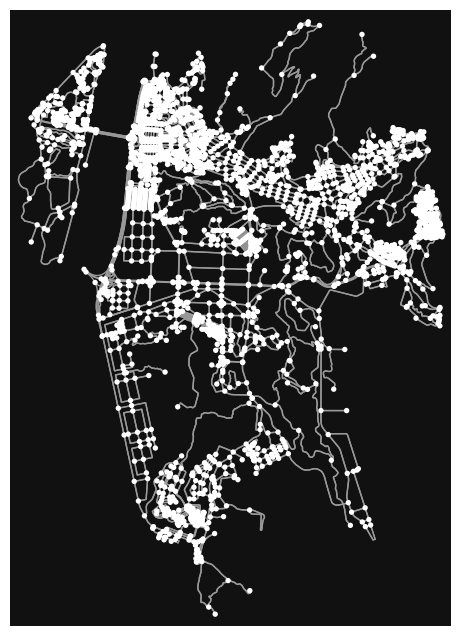

In [13]:
place = "Saha-gu, Busan, Korea"
G = ox.graph_from_place(place, network_type="all") # 그래픽 모델
fig, ax = ox.plot_graph(G)

In [14]:
hwy_colors = {'footway': 'skyblue',
              'residential': 'paleturquoise',
              'cycleway': 'lightgreen',
              'service': 'sienna',
              'living street': 'orange',
              'secondary': 'black',
              'pedestrian': 'lightskyblue'}

In [15]:
def find_edges(G, hwys):
  edges = []
  for u, v, k, data in G.edges(keys=True, data='highway'):
    check1 = isinstance(data, str) and data not in hwys
    check2 = isinstance(data, list) and all([d not in hwys for d in data])
    if check1 or check2:
      edges.append((u,v,k))
  return set(edges)

In [16]:
G_tmp = G.copy()
G_tmp.remove_edges_from(G.edges - find_edges(G, hwy_colors.keys()))
m = ox.plot_graph_folium(G_tmp, popup_attribute='highway', weight=3, color='black')

for hwy, color in hwy_colors.items():
  G_tmp = G.copy()
  G_tmp.remove_edges_from(find_edges(G_tmp, [hwy]))
  if G_tmp.edges:
    m = ox.plot_graph_folium(G_tmp, graph_map=m, popup_attribute='highway', weight=3, color=color)

In [17]:
m

##### 최단 거리 표시하기  


In [18]:
G = ox.speed.add_edge_speeds(G)
G = ox.speed.add_edge_travel_times(G)

In [19]:
orig = ox.distance.nearest_nodes(G,X=128.96755631796773,Y=35.11601594137444) # 출발지점
dest = ox.distance.nearest_nodes(G,X=128.96517223758627,Y=35.046698756214056) # 목표지점

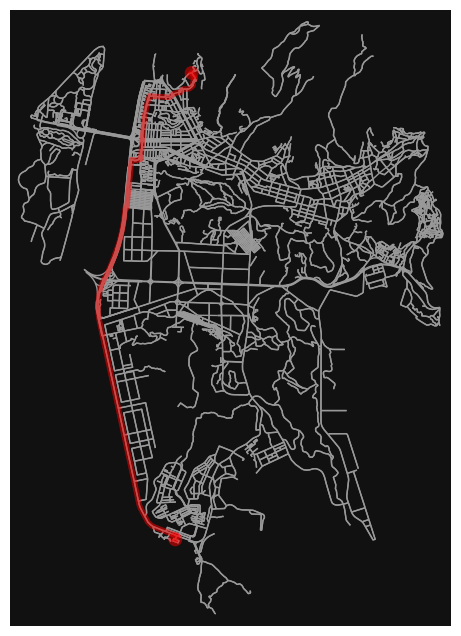

In [20]:
route = ox.shortest_path(G,orig,dest,weight="travel_time")
fig,ax = ox.plot_graph_route(G,route,node_size=0)

##### k-shortest  

In [21]:
routes = ox.k_shortest_paths(G,orig,dest,3,weight="travel_time")
paths = [r for r in routes]

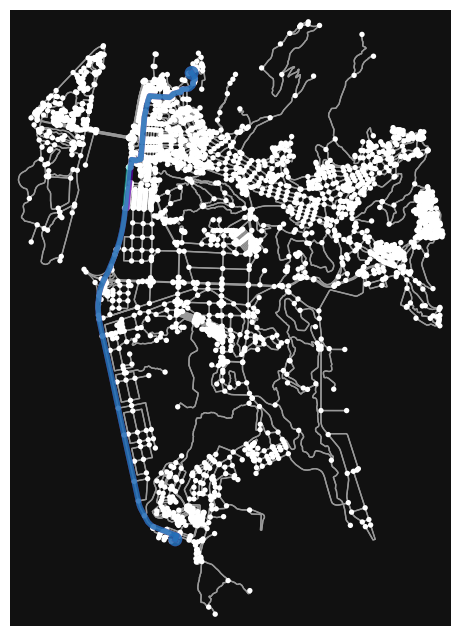

In [22]:
fig,ax = ox.plot_graph_routes(G, paths, route_colors=['r','b','c'], route_linewidth=3)

##### 도시 계획 분석  

In [23]:
from descartes import *
from shapely.geometry import *

In [24]:
trip_times = [1, 5, 10, 15, 20, 25, 30]
travel_speed = 4.5

In [25]:
meters_per_minute = travel_speed * 1000 / 60

In [26]:
address = "Hadan-dong,Saha-gu,Busan,Korea"
network_type = "walk"

In [27]:
G = ox.graph_from_address(address,network_type=network_type)# 원하는 지점과 해당 지도에 대해서 그래프
gdf_nodes = ox.graph_to_gdfs(G, edges=False) # x,y=gdf_nodes["geometry"].unary_union.centroid.xy #지도 중심점 좌표
# 동아대학교의 위경도 좌표 : lat -> 위도 x,경도->lony
x = 128.96817249950897
y = 35.11755694483541
center_node = ox.distance.nearest_nodes(G, x, y)
G = ox.project_graph(G)

In [28]:
meters_per_minute = travel_speed * 1000 / 60 #km per hour to m per minute 
for _, _, _, data in G.edges(data=True, keys=True):
    data["time"] = data["length"] / meters_per_minute

In [29]:
isochrone_polys = []
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap="plasma", start=0, return_hex=True)
for trip_time in sorted(trip_times, reverse=True):
    subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")
    node_points = [Point((data["x"], data["y"])) for node, data in subgraph.nodes(data=True)]
    #print(node_points)
    bounding_poly = gpd.GeoSeries(node_points).unary_union.convex_hull
    #print(bounding_poly)
    isochrone_polys.append(bounding_poly)
#print(isochrone_polys)

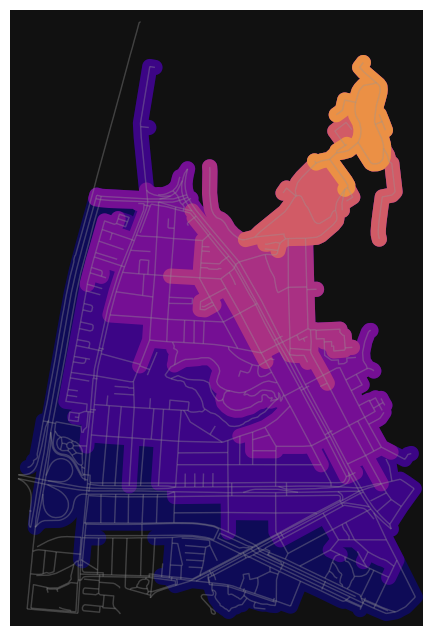

In [37]:
#### 오류 발생 코드 (2차원 배열로 인한 오류)
fig, ax = ox.plot_graph(G, show=False, close=False, edge_color="#999999", edge_alpha=0.2, node_size=0)
for polygon, fc in zip(isochrone_polys, iso_colors):
    #print(polygon)
    if polygon == None:
        continue
    patch = PolygonPatch(polygon, fc=fc, ec="none", alpha=0.6, zorder=-1)
    ax.add_patch(patch)
plt.show()

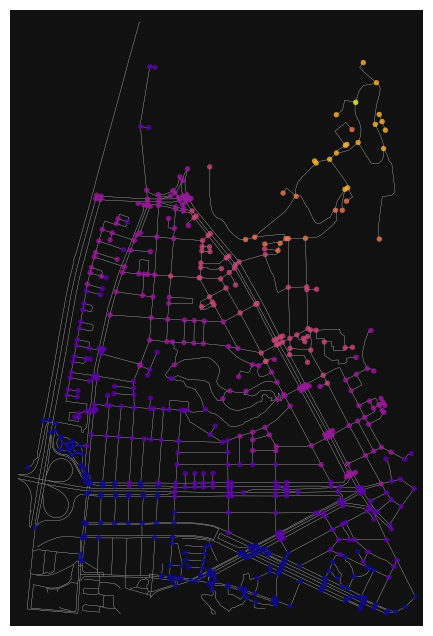

In [32]:
node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    sub_graph = nx.ego_graph(G, center_node, radius=trip_time, distance='time')
    for node in sub_graph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else "none" for node in G.nodes()]
ns = [15 if node in node_colors else 0 for node in G.nodes()]
fig, ax = ox.plot_graph(G, node_color=nc, node_size=ns, node_alpha=0.8, edge_linewidth=0.2, edge_color="#999999")

In [33]:
def make_iso_polys(G, edge_buff=25, node_buff=50, infill=False):
    isochrone_polys = []
    for trip_time in sorted(trip_times, reverse=True):
        subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")
        
        node_points = [Point((data["x"],data["y"])) for node, data in subgraph.nodes(data=True)]
        nodes_gdf = gpd.GeoDataFrame({"id":list(subgraph.nodes)}, geometry=node_points)
        nodes_gdf = nodes_gdf.set_index("id")
        
        edge_lines=[]
        for n_fr, n_to in subgraph.edges():
            f = nodes_gdf.loc[n_fr].geometry
            t = nodes_gdf.loc[n_to].geometry
            edge_lookup = G.get_edge_data(n_fr, n_to)[0].get("geometry", LineString([f,t]))
            edge_lines.append(edge_lookup)
        
        n = nodes_gdf.buffer(node_buff).geometry
        e = gpd.GeoSeries(edge_lines).buffer(edge_buff).geometry
        all_gs = list(n) + list(e)
        new_iso = gpd.GeoSeries(all_gs).unary_union
        
        #print(new_iso.exterior)
        
        if infill:
            if new_iso:
                new_iso = Polygon(new_iso.exterior.coords)
        isochrone_polys.append(new_iso)
    return isochrone_polys

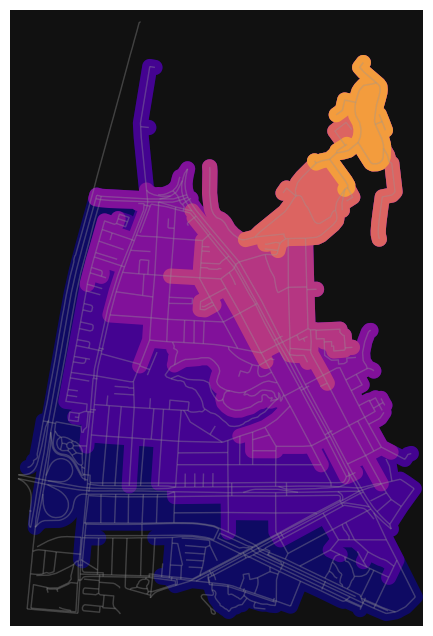

In [36]:
isochrone_polys = make_iso_polys(G, edge_buff=25, node_buff=0, infill=True)
fig, ax = ox.plot_graph(G, show=False, close=False, edge_color="#999999", edge_alpha=0.2, node_size=0)

for polygon, fc in zip(isochrone_polys, iso_colors):
    if polygon == None:
        continue
    patch = PolygonPatch(polygon, fc=fc, ec="none", alpha=0.7, zorder=-1)
    ax.add_patch(patch)
plt.show()